---
title: "Generate Synthetic Data Using Real Data with TabPFN"
description: "Sample new rows that mirror the statistics of an existing table"
icon: "plus"
cookbookTags:
  - extensions
authors:
  - name: Kürşat Kaya
    linkedin: https://www.linkedin.com/in/kursatkaya
    github: https://github.com/kursatfelsen
---

*Given a real table, sample new rows that follow the same statistical patterns.*

Tabular data is everywhere: spreadsheets, customer records, financial logs, medical registries. Yet getting a usable table for a demo or prototype is often blocked by privacy concerns and regulations. Synthetic data works around that: artificial rows that preserve the statistical patterns of the real table without exposing individual records.

Common tools include scikit-learn's [`make_*`](https://scikit-learn.org/stable/datasets/sample_generators.html) functions, [`Faker`](https://faker.readthedocs.io/) for rule-based generation, and GAN-based methods like [CTGAN](https://github.com/sdv-dev/CTGAN) or [TabGAN](https://github.com/Diyago/Tabular-data-generation). These are powerful but often complex to set up. TabPFN is a foundation model specialised for tabular data, and its unsupervised tools let us generate a look-alike table without training a GAN or building a simulation.

In this notebook we take an existing dataset (scikit-learn's Breast Cancer table) as the source, fit TabPFN's unsupervised model on it, and sample new rows that share its column distributions and correlations. The result is a standalone synthetic table that can stand in for the real one (for a demo, a test fixture, or to extend the training set) which we then compare against the original with [`table-evaluator`](https://github.com/Baukebrenninkmeijer/Table-Evaluator).

## Setup

*Installing TabPFN, its extensions, and `table-evaluator`.*

The unsupervised synthetic-data helpers live in `tabpfn_extensions`, and `table-evaluator` provides the visual fidelity checks we use at the end.

In [ ]:
!pip install -U tabpfn tabpfn_extensions "table-evaluator>=1.9" "dython>=0.7" scikit-learn "seaborn>=0.13"

## Imports and Data

*Loading the Breast Cancer dataset as our safe, realistic table.*

We use scikit-learn's Breast Cancer dataset, a classic, non-sensitive table that stands in for whatever proprietary data you would like to synthesise. We keep a train/test split so the synthetic table can later be compared against real data the model never saw.

In [8]:
import os

import pandas as pd
import torch
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

from tabpfn_extensions import TabPFNClassifier, TabPFNRegressor
from tabpfn_extensions.unsupervised import TabPFNUnsupervisedModel
from tabpfn_extensions.unsupervised.experiments import GenerateSyntheticDataExperiment

data = load_breast_cancer()
X, y = data["data"], data["target"]
feature_names = data["feature_names"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42
)

In [ ]:
from tabpfn_client import set_access_token
set_access_token(userdata.get('TABPFN_TOKEN'))

## Building the Unsupervised Model

*Wrapping a classifier and a regressor into `TabPFNUnsupervisedModel`.*

The synthetic-data experiment expects a `TabPFNUnsupervisedModel`, which pairs a `TabPFNClassifier` (for discrete columns) with a `TabPFNRegressor` (for continuous columns). Together they let TabPFN model each column conditional on the others and sample new rows from that joint distribution.

In [10]:
model_unsupervised = TabPFNUnsupervisedModel(
    tabpfn_clf=TabPFNClassifier(n_estimators=3),
    tabpfn_reg=TabPFNRegressor(n_estimators=3),
)

## Generating the Synthetic Table

*Running the experiment to produce look-alike rows.*

`GenerateSyntheticDataExperiment` handles the sampling loop. `temp` controls diversity: higher values give more varied rows, lower values stay closer to the training data. `n_samples` sets how many rows we want out. Here we ask for twice as many rows as the training split, over all 30 features. Inputs come in as tensors, and the resulting synthetic table is written to `synthetic.csv` for the evaluation step.

In [11]:
X_tensor = torch.tensor(X_train, dtype=torch.float32)
y_tensor = torch.tensor(y_train)

experiment = GenerateSyntheticDataExperiment(task_type="unsupervised")

experiment.run(
    tabpfn=model_unsupervised,
    X=X_tensor,
    y=y_tensor,
    attribute_names=feature_names,
    temp=1.0,  # temperature controls sample diversity
    n_samples=X_train.shape[0] * 2,  # 2x more rows than the original train split
    indices=list(range(X_tensor.shape[1])),
)

synthetic = experiment.data_synthetic.drop(columns=["real_or_synthetic"], errors="ignore")
synthetic.to_csv("synthetic.csv", index=False)
synthetic.head()

100%|██████████| 30/30 [01:40<00:00,  3.35s/it]


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,13.363407,16.441288,85.516998,553.198303,0.082179,0.061605,0.066697,0.040980,0.151968,0.056566,...,14.807053,20.372873,94.949722,682.556335,0.115120,0.122154,0.240092,0.096336,0.218800,0.072447
1,12.619973,15.794920,81.974686,483.532196,0.087885,0.111782,0.053319,0.030360,0.163469,0.066643,...,13.648538,19.480104,89.532341,577.266418,0.125912,0.325796,0.203869,0.101295,0.241521,0.103268
2,15.422915,14.619908,100.734337,719.590454,0.113079,0.133238,0.129874,0.071804,0.187609,0.066193,...,18.021919,19.117395,119.698105,961.645325,0.169212,0.378812,0.442507,0.173838,0.300495,0.103944
3,12.546910,16.986845,80.002007,489.896667,0.072575,0.046438,0.023193,0.014958,0.141472,0.056971,...,13.958496,22.080626,88.770744,603.202209,0.092452,0.143293,0.108836,0.063029,0.264225,0.074134
4,11.738303,16.127644,75.250076,426.929626,0.101015,0.066207,0.025876,0.025950,0.181918,0.062224,...,12.666892,22.931154,81.368088,489.277863,0.137176,0.143374,0.092852,0.079801,0.275973,0.077098


## Comparing Real vs. Synthetic

*Checking fidelity with `TableEvaluator`.*

A synthetic table is only useful if it behaves like the real thing. `TableEvaluator` compares the two side by side and reports on distribution overlap, correlation structure, and low-dimensional geometry. We call the three plots we care about directly (distributions, correlation difference, PCA) instead of `visual_evaluation`, which produces a much larger figure grid.

In [12]:
from table_evaluator import TableEvaluator

real = pd.DataFrame(data.data, columns=data.feature_names)
fake = pd.read_csv("synthetic.csv")

table_evaluator = TableEvaluator(real, fake)


### Distributions

*Do the synthetic columns look like the real ones?*

The per-feature histograms show how closely each synthetic column tracks the real distribution. A close overlap means the marginals have been preserved.

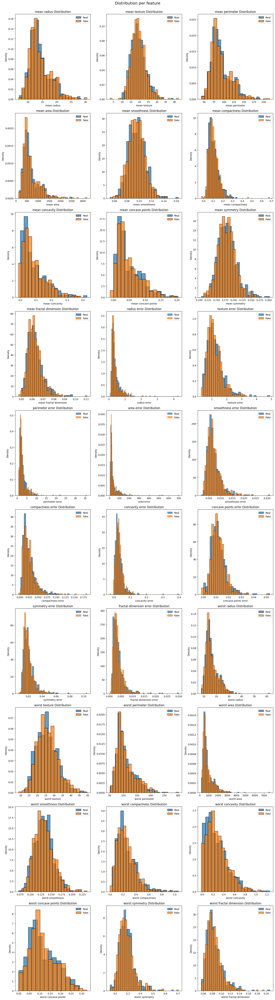

In [13]:
table_evaluator.plot_distributions()

### Correlations

*Are the relationships between features still there?*

TabPFN samples each column conditional on the others, so we care about more than just marginals. The correlation-difference heatmap highlights where the synthetic table's feature-to-feature relationships depart from the real table. Small values mean the joint structure held up.

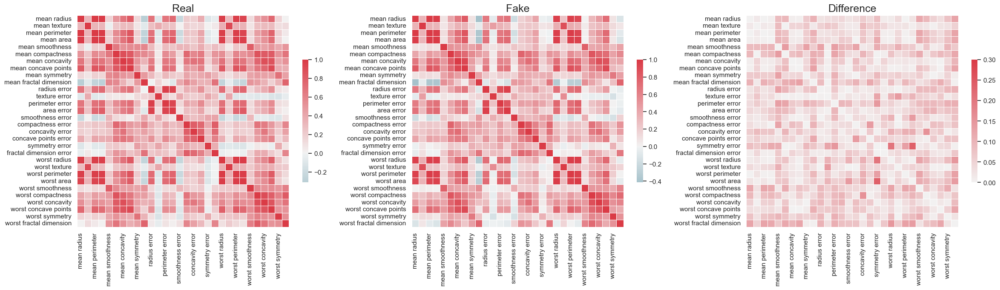

In [14]:
table_evaluator.plot_correlation_difference()

### PCA Projection

*Do the two tables share the same low-dimensional geometry?*

Projecting real and synthetic rows onto the first two principal components gives a quick visual check: overlapping clouds mean the synthetic rows live in the same subspace as the real ones.

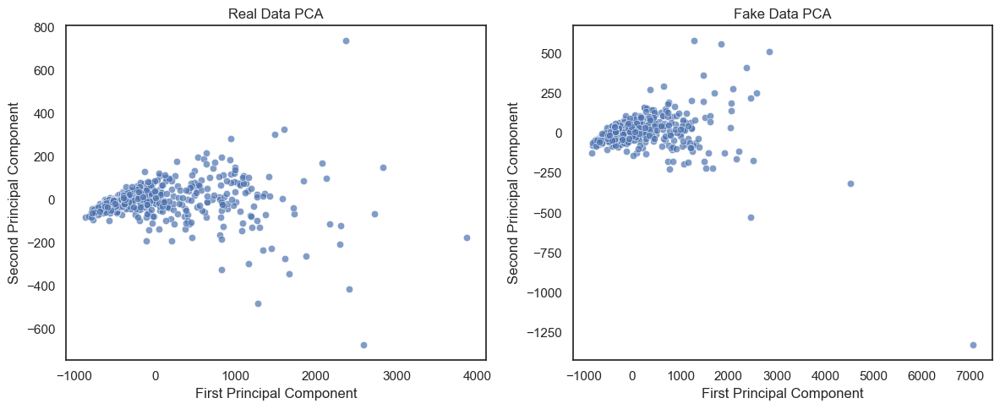

In [15]:
table_evaluator.plot_pca()

## When to Use This

*Where TabPFN-synthesised tables shine, and where they don't.*

The approach is lightweight, with no GAN training loop and no simulation environment, which makes it a good fit for:

- Realistic demo data to share with customers or collaborators without exposing real records.
- QA and pipeline tests with plausible rows before going live on real data.
- Fast prototyping when access to the real dataset is restricted.

A few caveats worth keeping in mind:

- Synthetic is not the same as anonymised. Privacy is improved but not guaranteed. For anything compliance-critical, add explicit checks like nearest-neighbour distance or re-identification-risk analysis.
- Very small source tables tend to give low-fidelity synthetic tables.
- TabPFN synthetic data is best positioned for demos, prototyping, and testing rather than as a drop-in replacement for regulated data releases.